<a href="https://colab.research.google.com/github/ssanudo/ProcesamDigImagTP/blob/main/TP2/PDItp2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Espacio YIQ**


El modelo YIQ define un espacio de color, usado por el estándar de televisión NTSC. Isignifica en fase (in-phase, en inglés), mientras que Qsignifica cuadratura (quadrature, en inglés) y se refieren a los componentes usados en la modulación de amplitud en cuadratura. 

El componente Y representa la información de luminancia (codifica la información de luminosidad de la imagen) y es el único componente utilizado por los televisores de blanco y negro. I y Q representan la información de crominancia (información de color de la imagen). 

El sistema YIQ está destinado a aprovechar las características de la respuesta humana al color. El ojo humano es más sensible a los cambios en el rango naranja-azul (equivalente a I) que en el rango púrpura-verde (Q), así se requiere menos ancho de banda para Q que para I. 

Las matrices de conversión, de RGB a YIQ y viseversa son:

$rgb2yiq=\begin{bmatrix}
0.299 & 0.587 & 0.114\\
0.595716 & -0.274453 & -0.321263\\
0.211456 & -0.522591& 0.311135
\end{bmatrix}$


$yiq2rgb=\begin{bmatrix}1&0.9663&0.621\\1&-0.2721&-0.6474\\1&-1.1070&1.7046\end{bmatrix}$



#Trabajo Práctico Nro. 2

La propuesta para esta actividad consiste en manipular independientemente la luminancia y la saturación de una imagen. Para ello convertimos cada pixel de la imagen del espacio RGB al espacio YIQ, luego alteramos los valores de Y (para cambiar la luminancia) y/o de IQ (para cambiar la saturación). Con los nuevos valores de YIQ, convertimos a RGB nuevamente y obtenemos una nueva imagen.

Observaciones: para cada uno estos deben mostrar la imagen original vs el resultado de la modificación realizada a la imagen para un diferente rango de valores de prueba de Y e IQ.

La segunda parte del TP2 consiste en utilizar algunos datasets 2D (pueden ser mapas de altitud, de temperatura, etc.) y “visualizarlos” con diferentes paletas, incluyendo la de niveles de gris y la arco iris.
Observaciones: el objetivo es ver cómo con diferentes paletas de colores se pueden apreciar ciertos detalles de una imagen, sin necesidad de modificar el contenido de la misma.


In [2]:

#Librerías
import numpy as np
from PIL import Image
import imageio
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [3]:


def normalizeRGB(x):return np.array((x - np.min(x)) / (np.max(x) - np.min(x)))
#Normaliza el valor RGB de la imagen en el rango [0,1], x es el arreglo de RGB de la img.
   


#Defino las matrices de conversión, de RGB a YIQ y viseversa.
rgb2yiq=np.array([[0.299,0.587,0.114],[0.595716,-0.274453,-0.321263],[0.211456,-0.522591,0.311135]])
#print(rgb2yiq)
yiq2rgb=np.array([[1,0.9663,0.621],[1,-0.2721,-0.6474],[1,-1.1070,1.7046]])
#print(yiq2rgb)


def ModifyYIQ(im,alfa,beta): #función que altera el YIQ de una imágen, con alfa como coef de Luminancia, y a beta coef de saturación o crominancia.
  
  #Normalizo valores RGB de 0-255 a 0-1
  imNorm=normalizeRGB(im.copy())
  #Obtengo valores de YIQ 
  Arr_YIQ=np.dot(imNorm, rgb2yiq.T)

  #modifico luminancia
  Arr_YIQmod=Arr_YIQ.copy()
  Arr_YIQmod[:,:,0]=alfa*Arr_YIQmod[:,:,0]
  Arr_YIQmod[:,:,1]=beta*Arr_YIQmod[:,:,1]
  Arr_YIQmod[:,:,2]=beta*Arr_YIQmod[:,:,2]
 
  #Fuerzo los valores fuera de rango
  Arr_YIQmod[:,:,0][Arr_YIQmod[:,:,0]>=1]=1
  Arr_YIQmod[:,:,1][Arr_YIQmod[:,:,1]<-0.5957]=-0.5957
  Arr_YIQmod[:,:,1][Arr_YIQmod[:,:,1]>0.5957]=0.5957
  Arr_YIQmod[:,:,2][Arr_YIQmod[:,:,2]<-0.5226]=-0.5226
  Arr_YIQmod[:,:,2][Arr_YIQmod[:,:,2]>0.5226]=0.5226
  #print('Arr_YIQmod',Arr_YIQmod)
  #Vuelvo a RGB normalizado
  Arr_RGBmod=np.dot(Arr_YIQmod, yiq2rgb.T)
  #Desnormalizo
  Arr_RGBmod=Arr_RGBmod*255
  ImMod=Arr_RGBmod.astype('uint8')
  return ImMod



#**Espacio YIQ. Primera Parte**

A continuación, a partir de la conversión del RGB de la imágen a YIQ, es posible variar su luminancia con alfa, y cromaticidad con beta.

Tamaño del arreglo (300, 451, 3) donde 300 x 451 es el tamaño de la imágen en píxeles, y  3 es el valor RGB de cada uno de dichos píxeles


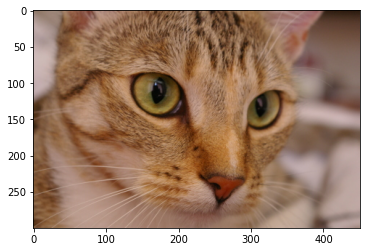

In [ ]:
#
#@title ## Image Luminance (Y) and Chromatizity (IQ) 
#@markdown You can use your image or use mine: imageio:chelsea.png
#@markdown ---
#@markdown ### Enter an Image path:
file_path = "imageio:chelsea.png" #@param {type:"string"}
#@markdown ---

#Abro la img en PNG como un arreglo
im = imageio.imread(file_path)
print('Tamaño del arreglo',im.shape, 'donde', im.shape[0], 'x',im.shape[1],'es el tamaño de la imágen en píxeles, y ',im.shape[2], 'es el valor RGB de cada uno de dichos píxeles' )
plt.imshow(im)

Luminancia: 0.6 * Y
Cromaticidad: 1  * I,  1  * Q
A continuación se muestra la imágen original (izquierda) y la modificada (derecha)


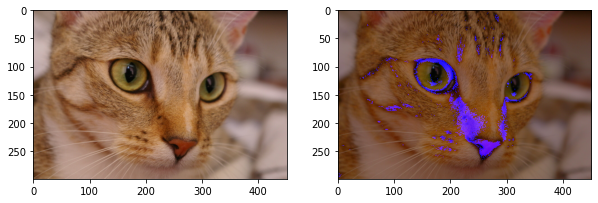

In [ ]:
#@title ## Cambio los factores de Luminancia y Crominancia en el espacio YIQ de una imágen
#@markdown  Seleccione los valores a modificar:

Luminancia=0.6 #@param {type:"slider", min:-4, max:4, step:0.1}
Cromaticidad=1 #@param {type:"slider", min:-4, max:4, step:0.1}


print('Luminancia:',Luminancia,'* Y')
print('Cromaticidad:',Cromaticidad,' * I, ',Cromaticidad,' * Q')
print('A continuación se muestra la imágen original (izquierda) y la modificada (derecha)')
ImMod=ModifyYIQ(im,Luminancia,Cromaticidad)


fig = plt.figure(figsize=(10, 20))
fig.add_subplot(1, 2, 1)
plt.imshow(im)
fig.add_subplot(1, 2, 2)
plt.imshow(ImMod)
plt.show()

#Análisis
En esta parte se grafican imágenes variando **Crom**inancia (IQ) con el factor beta (Crom) y **Lum**inancia (Y) con el factor alfa (Lum) .

Fila:1-> Variamos la Luminancia (Lum)


<Figure size 432x288 with 0 Axes>

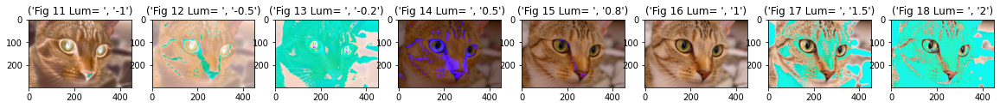

Fila:2->Variamos la Luminancia (Lum) y Crominancia= 0.5


<Figure size 432x288 with 0 Axes>

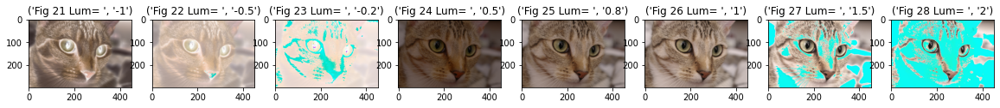

Fila:3->Variamos la Luminancia (Lum) y Crominancia= 0


<Figure size 432x288 with 0 Axes>

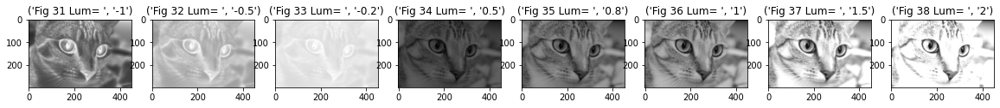

Fila:4->Variamos la Crominancia (Crom)


<Figure size 432x288 with 0 Axes>

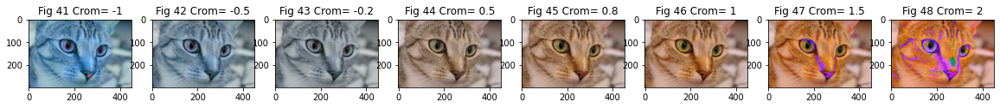

Fila:5->Variamos la Crominancia (Crom) para Y (Luminancia)=0.5


<Figure size 432x288 with 0 Axes>

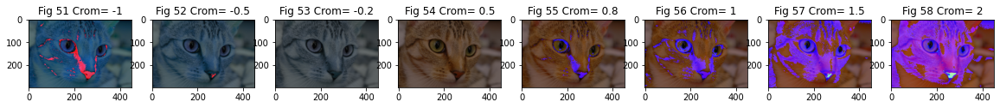

Fila:6->Variamos la Crominancia (Crom) para Y (Luminancia)=0


<Figure size 432x288 with 0 Axes>

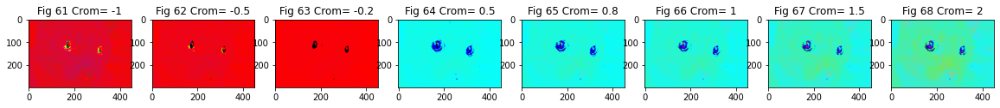

In [ ]:

fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
fila=1
print('Fila:'+str(fila)+'-> Variamos la Luminancia (Lum)')
for Lum in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Luminancia a',Lum ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,Lum,1)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Lum= ',str(Lum)
      plt.title(column)
      i=i+1

plt.show()
fila=fila+1
fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
print('Fila:'+str(fila)+'->Variamos la Luminancia (Lum) y Crominancia= 0.5')
for Lum in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Luminancia a',Lum ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,Lum,0.5)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Lum= ',str(Lum)
      plt.title(column)
      i=i+1

plt.show()
fila=fila+1
fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
print('Fila:'+str(fila)+'->Variamos la Luminancia (Lum) y Crominancia= 0')
for Lum in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Luminancia a',Lum ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,Lum,0)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Lum= ',str(Lum)
      plt.title(column)
      i=i+1

plt.show()
fila=fila+1
fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
print('Fila:'+str(fila)+'->Variamos la Crominancia (Crom)')
for Crom in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Crominancia a',Crom ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,1,Crom)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Crom= '+str(Crom)
      plt.title(column)
      i=i+1

plt.show()

fila=fila+1
fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
print('Fila:'+str(fila)+'->Variamos la Crominancia (Crom) para Y (Luminancia)=0.5')
for Crom in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Crominancia a',Crom ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,0.5,Crom)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Crom= '+str(Crom)
      plt.title(column)
      i=i+1

plt.show()



fig = plt.figure()
fig = plt.figure(figsize=(20, 40))
i=1
fila=fila+1
print('Fila:'+str(fila)+'->Variamos la Crominancia (Crom) para Y (Luminancia)=0')
for Crom in [-1,-0.5,-0.2,0.5,0.8,1,1.5,2]: 
      #print('Variamos la Crominancia a',Crom ,'en la Figura: ', i)     
      fig.add_subplot(1,8,i)
      imAlt=ModifyYIQ(im,0,Crom)
      plt.imshow(imAlt)
      column='Fig '+str(fila)+str(i)+' Crom= '+str(Crom)
      plt.title(column)
      i=i+1

plt.show()



**Análisis de las imágenes:** Cuando dejamos Crominancia sin modificaciones, y variamos Luminancia, cuando $Lum(alfa) <1$, y positivo, se puede ver un oscurecimiento de la imágen. 
Cuando dejamos Crominancia sin modificaciones, y variamos Luminancia, cuando $Lum(alfa) <1$, y positivo, se puede ver un oscurecimiento de la imágen. Tiene el mismo efecto cuando $Crom=beta=0.5$.
Cuando la imágen satura en Luminancia, se ven objetos planos.
Cuando la Crominancia es nula, se ve blanco y negro, y al variar alfa, se observan los efectos de Luminancia comentados anteriormente.
Cuando dejamos Luminancia sin modificaciones, y variamos Crominancia, vemos el cambio en los colores. 
Cuando anulamos la Crominancia, tercer fila de imágenes, puedo ver el efecto de la luminancia claramente.
Cuando anulamos la Luminancia, perdemos la imágen, el contraste, y solo vemos color (última fila); es por ello que la mayor importancia perceptual cae en la luminancia,Y.


A continuación se realiza un **ejemplo dado en teoría** que expone la dificultad de ver el color verde puro y magenta, analizando sus valores de YIQ. Efectivamente, se ve que en crominancia son opuestos, como era de esperar, pero en Y son muy similares.


In [ ]:
#Ejemplo planteado en teoría

RGBgreen=np.ones((3, 1), int)
RGBgreen[0]=0
RGBgreen[2]=0
RGBmag=np.ones((3, 1), int)
RGBmag[1]=0

YIQgreen=rgb2yiq.dot(RGBgreen)
print('El valor YIQ del verde es= ',YIQgreen)
YIQmag=rgb2yiq.dot(RGBmag)
print('El valor YIQ del magenta es= ',YIQmag)

El valor YIQ del verde es=  [[ 0.587   ]
 [-0.274453]
 [-0.522591]]
El valor YIQ del magenta es=  [[0.413   ]
 [0.274453]
 [0.522591]]


In [ ]:
RGBgreen


array([[0],
       [1],
       [0]])

#**Espacio YIQ. Segunda Parte** 
Trabajo con paletas de colores.


**Consigna: ** La idea en esta parte del práctico es tomar una imagen preferiblemente que represente algún tipo de dato como temperatura, profundidad, etc. Si la imagen esta en RGB, pasarla al espacio YIQ y plotear ‘Y' para diferentes paletas de color, empezando por gray y otras 4 más. Así podrás observar cómo con diferentes paletas se realzan u ocultan ciertas zonas de la imagen. 

**Dificultad: **Intenté de varias maneras al final graficarlas con los cmap de Mathplotlib, pero no funcionan. Debería utilizar Normalize? Cuál puede ser el problema? 


Tamaño del arreglo (313, 448, 4) donde 313 x 448 es el tamaño de la imágen en píxeles, y  4 es el valor RGB de cada uno de dichos píxeles


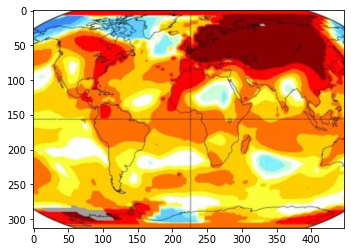

In [4]:
#Abro la img en PNG como un arreglo
#Imagen de temperaturas
im2 = imageio.imread('/content/TempMap.png')
print('Tamaño del arreglo',im2.shape, 'donde', im2.shape[0], 'x',im2.shape[1],'es el tamaño de la imágen en píxeles, y ',im2.shape[2], 'es el valor RGB de cada uno de dichos píxeles' )
plt.imshow(im2)

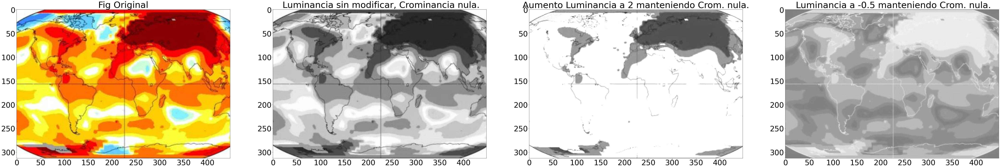

In [ ]:

#Dibujo la imágen en blanco y negro

imBW=ModifyYIQ(im2[:,:,0:3],1,0)
imBW2=ModifyYIQ(im2[:,:,0:3],2,0)
imBW3=ModifyYIQ(im2[:,:,0:3],-0.5,0)
fig = plt.figure(figsize=(100, 200))
plt.rcParams.update({'font.size':42})
fig.add_subplot(1, 4, 1)
column='Fig Original'
plt.title(column)
plt.imshow(im2)
fig.add_subplot(1, 4, 2)
plt.imshow(imBW)
column=' Luminancia sin modificar, Crominancia nula.'
plt.title(column)
fig.add_subplot(1, 4, 3)
plt.imshow(imBW2)
column='Aumento Luminancia a 2 manteniendo Crom. nula.'
plt.title(column)
fig.add_subplot(1, 4, 4)
plt.imshow(imBW3)
column=' Luminancia a -0.5 manteniendo Crom. nula.'
plt.title(column)
plt.show()

En las figuras se puede observar como al variar la luminancia, obtengo diferentes paletas en tonos de grises. Si la aumento mucho pierdo información, si la hago negativa invierto el sentido de la paleta, colores mas oscuros se ven mas claros.

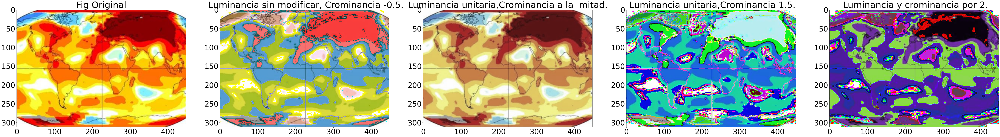

In [ ]:
imColor=ModifyYIQ(im2[:,:,0:3],1,-0.5)
imColor2=ModifyYIQ(im2[:,:,0:3],1,0.5)
imColor3=ModifyYIQ(im2[:,:,0:3],1,1.5)
imColor4=ModifyYIQ(im2[:,:,0:3],2,2)
fig = plt.figure(figsize=(100, 200))
fig.add_subplot(1, 5, 1)
column='Fig Original'
plt.title(column)
plt.imshow(im2)
fig.add_subplot(1, 5, 2)
plt.imshow(imColor)
column=' Luminancia sin modificar, Crominancia -0.5.'
plt.title(column)
fig.add_subplot(1, 5, 3)
plt.imshow(imColor2)
column='Luminancia unitaria,Crominancia a la  mitad.'
plt.title(column)
fig.add_subplot(1, 5, 4)
plt.imshow(imColor3)
column=' Luminancia unitaria,Crominancia 1.5.'
plt.title(column)
fig.add_subplot(1, 5, 5)
plt.imshow(imColor4)
column=' Luminancia y crominancia por 2.'
plt.title(column)
plt.show()

En las figuras puede observarse que al modificar levemente la crominancia, de manera negativa los colores son opuestos al original. Cuando se varía de manera positiva, y levemente por debajo de 1, se mantiene la paleta solo que en colores mas claros, menos intensos.
Al modificar sobre 1 la crominancia, el cambio en colores es abrupto. Ni hablar si además se varía (y aumenta) la luminancia.

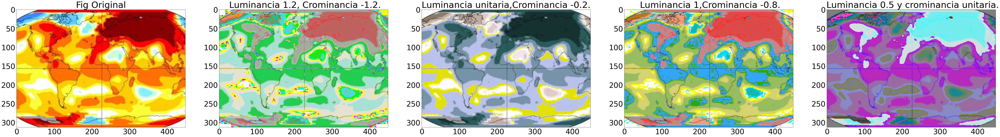

In [ ]:
imColor=ModifyYIQ(im2[:,:,0:3],1.2,-1.2)
imColor2=ModifyYIQ(im2[:,:,0:3],1,-0.2)
imColor3=ModifyYIQ(im2[:,:,0:3],1,-0.8)
imColor4=ModifyYIQ(im2[:,:,0:3],0.5,1)
fig = plt.figure(figsize=(100, 200))
fig.add_subplot(1, 5, 1)
column='Fig Original'
plt.title(column)
plt.imshow(im2)
fig.add_subplot(1, 5, 2)
plt.imshow(imColor)
column=' Luminancia 1.2, Crominancia -1.2.'
plt.title(column)
fig.add_subplot(1, 5, 3)
plt.imshow(imColor2)
column='Luminancia unitaria,Crominancia -0.2.'
plt.title(column)
fig.add_subplot(1, 5, 4)
plt.imshow(imColor3)
column=' Luminancia 1,Crominancia -0.8.'
plt.title(column)
fig.add_subplot(1, 5, 5)
plt.imshow(imColor4)
column=' Luminancia 0.5 y crominancia unitaria.'
plt.title(column)
plt.show()

In [ ]:
En éste caso se puede ver que en el caso de Lum=Crom=1.2, aunque es poco agradable a la vista, hay gran contraste entre rojo y amarillo, por lo que se ven detalles mínimos no divisados en otra paleta de las graficadas.
Cuando baja la Luminancia, en general perdemos detalles.

A continuación intento graficar los diferentes cmap de Matplotlib.


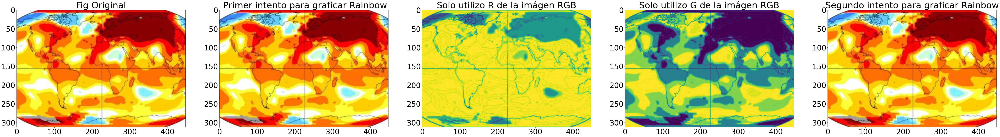

In [8]:
import matplotlib.image as mpimg
from matplotlib import cm

from collections import OrderedDict

fig = plt.figure(figsize=(100, 200))
plt.rcParams.update({'font.size':42})
fig.add_subplot(1, 5, 1)
column='Fig Original'
plt.title(column)
plt.imshow(im2)
fig.add_subplot(1, 5, 2)
imgplot = plt.imshow(im2)
imgplot.set_cmap('rainbow')
column=' Primer intento para graficar Rainbow'
plt.title(column)
fig.add_subplot(1, 5, 3)
plt.imshow(im2[:,:,0])
column='Solo utilizo R de la imágen RGB'
plt.title(column)
fig.add_subplot(1, 5, 4)
plt.imshow(im2[:,:,1])
column='Solo utilizo G de la imágen RGB'
plt.title(column)
fig.add_subplot(1, 5, 5)
plt.imshow(im2,cmap= 'rainbow')
column='Segundo intento para graficar Rainbow'
plt.title(column)
plt.show()
